# Lab 1: Independent Component Analysis

### Machine Learning 2 (2017/2018)

* The lab exercises should be made in groups of two people.
* The deadline is Thursday, April 19, 23:59.
* Assignment should be submitted through BlackBoard! Make sure to include your and your teammates' names with the submission.
* Attach the .IPYNB (IPython Notebook) file containing your code and answers. Naming of the file should be "studentid1\_studentid2\_lab#", for example, the attached file should be "12345\_12346\_lab1.ipynb". Only use underscores ("\_") to connect ids, otherwise the files cannot be parsed.

Notes on implementation:

* You should write your code and answers in an IPython Notebook: http://ipython.org/notebook.html. If you have problems, please ask.
* Use __one cell__ for code and markdown answers only!
    * Put all code in the cell with the ```# YOUR CODE HERE``` comment and overwrite the ```raise NotImplementedError()``` line.
    * For theoretical questions, put your solution using LaTeX style formatting in the YOUR ANSWER HERE cell.
* Among the first lines of your notebook should be "%pylab inline". This imports all required modules, and your plots will appear inline.
* Large parts of you notebook will be graded automatically. Therefore it is important that your notebook can be run completely without errors and within a reasonable time limit. To test your notebook before submission, select Kernel -> Restart \& Run All.

### Literature
In this assignment, we will implement the Independent Component Analysis algorithm as described in chapter 34 of David MacKay's book "Information Theory, Inference, and Learning Algorithms", which is freely available here:
http://www.inference.phy.cam.ac.uk/mackay/itila/book.html

Read the ICA chapter carefuly before you continue!

### Notation

$\mathbf{X}$ is the $M \times T$ data matrix, containing $M$ measurements at $T$ time steps.

$\mathbf{S}$ is the $S \times T$ source matrix, containing $S$ source signal values at $T$ time steps. We will assume $S = M$.

$\mathbf{A}$ is the mixing matrix. We have $\mathbf{X} = \mathbf{A S}$.

$\mathbf{W}$ is the matrix we aim to learn. It is the inverse of $\mathbf{A}$, up to indeterminacies (scaling and permutation of sources).

$\phi$ is an elementwise non-linearity or activation function, typically applied to elements of $\mathbf{W X}$.

### Code
In the following assignments, you can make use of the signal generators listed below.



In [1]:
%pylab inline
import sys
assert sys.version_info[:3] >= (3, 6, 0), "Make sure you have Python 3.6 installed"

# Signal generators
def sawtooth(x, period=0.2, amp=1.0, phase=0.):
    return (((x / period - phase - 0.5) % 1) - 0.5) * 2 * amp

def sine_wave(x, period=0.2, amp=1.0, phase=0.):
    return np.sin((x / period - phase) * 2 * np.pi) * amp

def square_wave(x, period=0.2, amp=1.0, phase=0.):
    return ((np.floor(2 * x / period - 2 * phase - 1) % 2 == 0).astype(float) - 0.5) * 2 * amp

def triangle_wave(x, period=0.2, amp=1.0, phase=0.):
    return (sawtooth(x, period, 1., phase) * square_wave(x, period, 1., phase) + 0.5) * 2 * amp

def random_nonsingular_matrix(d=2):
    """
    Generates a random nonsingular (invertible) matrix of shape d*d
    """
    epsilon = 0.1
    A = np.random.rand(d, d)
    while abs(np.linalg.det(A)) < epsilon:
        A = np.random.rand(d, d)
    return A

def plot_signals(X, title="Signals"):
    """
    Plot the signals contained in the rows of X.
    """
    figure()
    
    for i in range(X.shape[0]):
        ax = plt.subplot(X.shape[0], 1, i + 1)
        plot(X[i, :])
        ax.set_xticks([])
        ax.set_yticks([])
    plt.suptitle(title)

Populating the interactive namespace from numpy and matplotlib


The following code generates some toy data to work with.

In [2]:
signals = ["sawtooth", "sine", "square", "triangle", "random"]

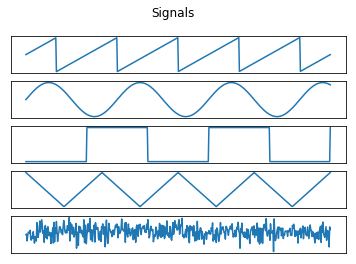

In [3]:
# Generate data
num_sources = 5
signal_length = 500
t = linspace(0, 1, signal_length)
S = np.c_[sawtooth(t), sine_wave(t, 0.3), square_wave(t, 0.4), triangle_wave(t, 0.25), np.random.randn(t.size)].T
plot_signals(S)

### 1.1 Make mixtures (5 points)
Write a function `make_mixtures(S, A)' that takes a matrix of source signals $\mathbf{S}$ and a mixing matrix $\mathbf{A}$, and generates mixed signals $\mathbf{X}$.

In [4]:
### 1.1 Make mixtures
def make_mixtures(S, A):
    return A@S

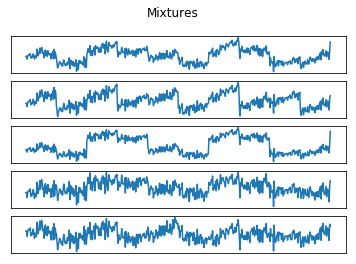

In [5]:
### Test your function
np.random.seed(42)
A = random_nonsingular_matrix(d=S.shape[0])
X = make_mixtures(S, A)
plot_signals(X, "Mixtures")

assert X.shape == (num_sources, signal_length), "The shape of your mixed signals is incorrect"


### 1.2 Histogram (5 points)
Write a function `plot_histograms(X)` that takes a data-matrix $\mathbf{X}$ and plots one histogram for each signal (row) in $\mathbf{X}$. You can use the `np.histogram()` (followed by `plot`) or `plt.hist()` function. 

Plot histograms of the sources and the measurements.

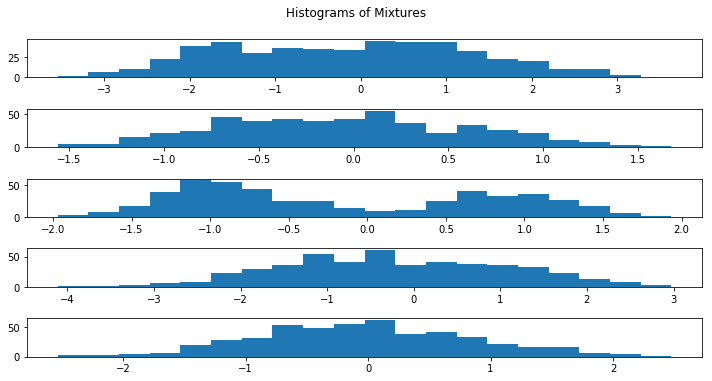

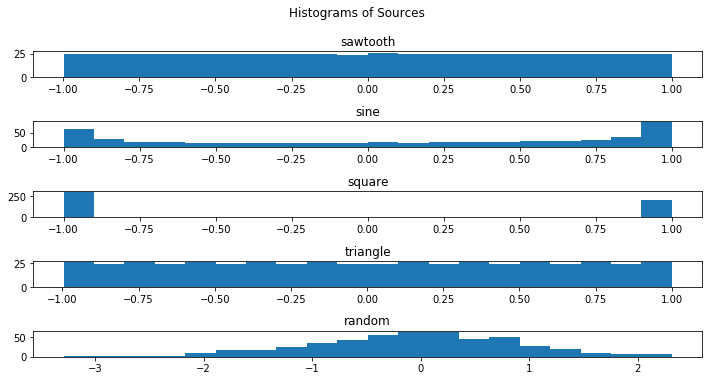

In [6]:
def plot_histograms(X, title, subtitles=[]):
    
    f, axes = plt.subplots(X.shape[0], figsize=(10, 5))
    
    f.suptitle(title, y=1.05)
    
    for i in range(len(axes)):
        ax = axes[i]
        ax.hist(X[i, :], bins= 20)

        if len(subtitles) > 0:
            ax.title.set_text(subtitles[i])
    
    plt.tight_layout()

plot_histograms(X, 'Histograms of Mixtures')

plot_histograms(S, 'Histograms of Sources', signals)
    

Which of these distributions (sources or measurements) tend to look more like Gaussians? Can you think of an explanation for this phenomenon? Why is this important for ICA?

The distribution that looks more like Gaussians is the $random$ one. The $random$ distribution, indeed, is generated by a Gaussian distribution.

It is important, because one of the assumptions in ICA is that the sources distributions are not Gaussian.

### 1.3 Implicit priors (20 points)
As explained in MacKay's book, an activation function $\phi$ used in the ICA learning algorithm corresponds to a prior distribution over sources. Specifically, $\phi(a) = \frac{d}{da} \ln p(a)$. For each of the following activation functions, *derive* the source distribution they correspond to.
$$\phi_0(a) = -\tanh(a)$$
$$\phi_1(a) = -a + \tanh(a)$$
$$\phi_2(a) = -a^3$$
$$\phi_3(a) = -\frac{6a}{a^2 + 5}$$

Give your answer without the normalizing constant, so an answer of the form $p(a) \propto \verb+[answer]+$ is ok.


$ \phi(a) = \frac{d}{da} \ln p(a) \implies \int \phi(a) da = \ln p(a)$ 

Therefore, we can integrate these functions to get the corresponding probability distributions:

***
## $\phi(a) = - tanh(a) = -\frac{1-e^{-2a}}{1+e^{-2a}}$

$\int \phi(a) da = - \int \frac{1-e^{-2a}}{1+e^{-2a}} da$

Using substitution $ y = e^{-2x}$:

$- \int \frac{1-e^{-2a}}{1+e^{-2a}} da = - \int \frac{1-y}{1+y} \left(-\frac{1}{2y}\right)dy = \frac{1}{2} \int \frac{1}{y} dy - \int \frac{1}{1+y} dy = \frac{1}{y} \ln |y| - \ln |1 + y| + c = -a - \ln (1 + e^{-2a}) + c$

Therefore:

$\ln p(a) = -a - \ln (1 + e^{-2a}) + c$ 

$p(a) = \frac{e^c}{e^a(1 + e^{-2a})}$ 

$p(a) \propto \frac{1}{e^a(1 + e^{-2a})}$ 

***
## $\phi(a) = -a + \tanh(a)$

$\int \phi(a) da = - \int a \ da - \int -\tanh(a) da$

using the previous result:

$\int \phi(a) da = - \int a \ da - (-a - \ln (1 + e^{-2a}) + c) = -\frac{1}{2}a^2 + a + \ln (1 + e^{-2a}) + c$

So:

$p(a) \propto e^{-\frac{1}{2}a^2 + a} + e^{-\frac{1}{2}a^2 - a}$ 

***

## $\phi(a) = -a^3$

$\int \phi(a) da = - \int a^3 \ da = -\frac{1}{4} a^4 + c$

So:

$p(a) \propto e^{-\frac{1}{4}a^4}$ 

***

## $\phi(a) = -\frac{6a}{a^2 + 5}$

$\int \phi(a) da = \int -\frac{6a}{a^2 + 5} da = -3 \int \frac{2a}{a^2 + 5} da = -3 \ln |a^2 + 5| + c$

So:

$p(a) \propto \frac{1}{(a^2 + 5)^3}$ 

***





In [7]:
def phi_0(a):
    return -np.tanh(a)

def p_0(a):
    return np.exp(-a) / (1 + np.exp(-2*a))

In [8]:
def phi_1(a):
    return -a + np.tanh(a)

def p_1(a):
    return np.exp(-0.5*a*a + a) + np.exp(-0.5*a*a - a)

In [9]:
def phi_2(a):
    return -a**3

def p_2(a):
    return np.exp(-0.25*a**4)

In [10]:
def phi_3(a):
    return -6*a / (a**2 + 5)

def p_3(a):
    return (a**2 + 5)**(-3)

In [11]:
activation_functions = [phi_0, phi_1, phi_2, phi_3]
priors = [p_0, p_1, p_2, p_3]

a = np.linspace(-5, 5, 1000)
for prior in priors:
    assert prior(a).shape == (1000, ), "Wrong output shape"


Plot the activation functions and the corresponding prior distributions, from $a = -5$ to $5$ (hint: use the lists defined in the cell above). Compare the shape of the priors to the histogram you plotted in the last question.

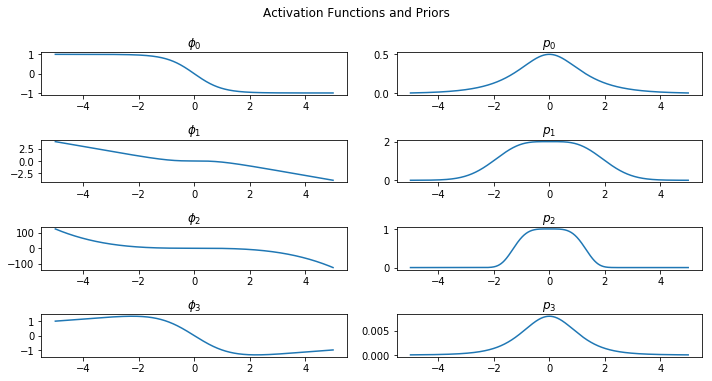

In [12]:
### 1.3 Implicit priors (continued)
a = np.linspace(-5, 5, 1000)


f, axes = plt.subplots(len(priors), 2, figsize=(10, 5))
    
f.suptitle('Activation Functions and Priors', y=1.05)
    
for i, prior in enumerate(priors):
    ax = axes[i][0]
    ax.plot(a, activation_functions[i](a))
    ax.title.set_text('$\phi_%d$' % (i,))
    
    ax = axes[i][1]
    ax.plot(a, priors[i](a))
    ax.title.set_text('$p_%d$' % (i,))
    
    
    
plt.tight_layout()    



All priors resemble a bell-shaped distribution like the gaussian one (the $random$ one of the signals), with $p_0$ and $p_3$ being the most similar.

### 1.4 Whitening (15 points)
Some ICA algorithms can only learn from whitened data. Write a method `whiten(X)` that takes a $M \times T$ data matrix $\mathbf{X}$ (where $M$ is the dimensionality and $T$ the number of examples) and returns a whitened matrix. If you forgot what whitening is or how to compute it, various good sources are available online, such as http://courses.media.mit.edu/2010fall/mas622j/whiten.pdf. Your function should also center the data before whitening.

In [13]:
### 1.4 Whitening
def whiten(X):
    
    [M, T] = X.shape
    
    X = (X.T - np.mean(X, axis=1).T).T

    Sigma = X@X.T /T
    
    [Lambda, Phi] = np.linalg.eig(Sigma)
    
    Lambda_inv_sqrt = np.diag(1 / np.sqrt(Lambda))
    
    return Lambda_inv_sqrt@Phi.T@X

In [14]:
### Test your function
Xw = whiten(X)
assert Xw.shape == (num_sources, signal_length), "The shape of your mixed signals is incorrect"


### 1.5 Interpret results of whitening (10 points)
Make 3 figures, one for the sources, one for measurements and one for the whitened measurements. In each figure, make $5 \times 5$ subplots with scatter plots for each pair of signals. Each axis represents a signal and each time-instance is plotted as a dot in this space. You can use the `plt.scatter()` function. Describe what you see.

Now compute and visualize the covariance matrix of the sources, the measurements and the whitened measurements. You can visualize each covariance matrix using this code:
```python
# Dummy covariance matrix C;
C = np.eye(5)  
ax = imshow(C, cmap='gray', interpolation='nearest')
```

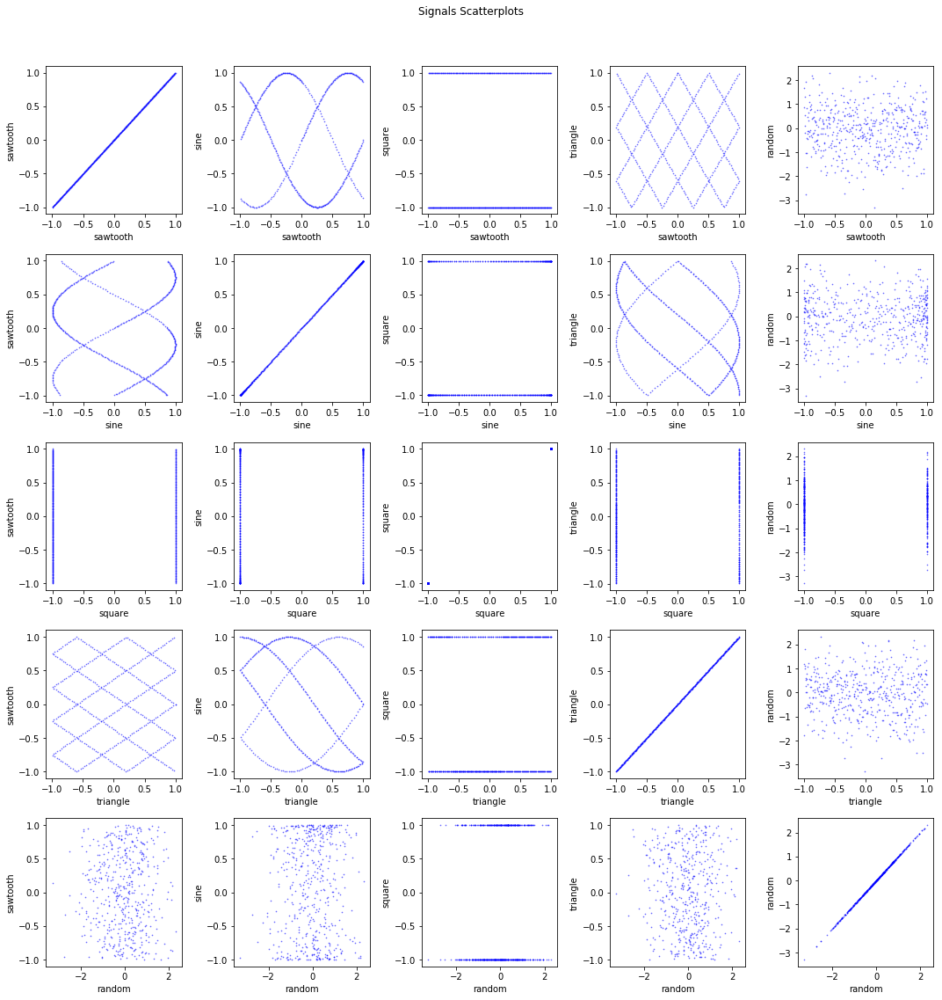

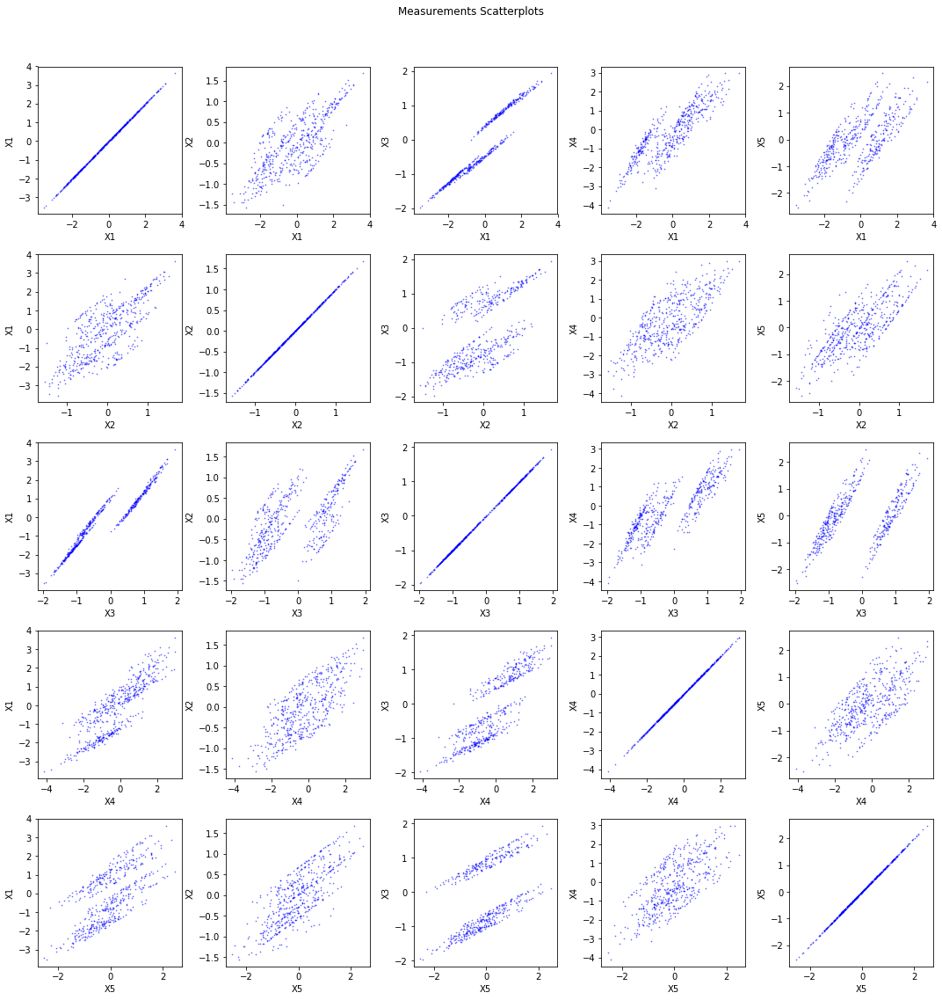

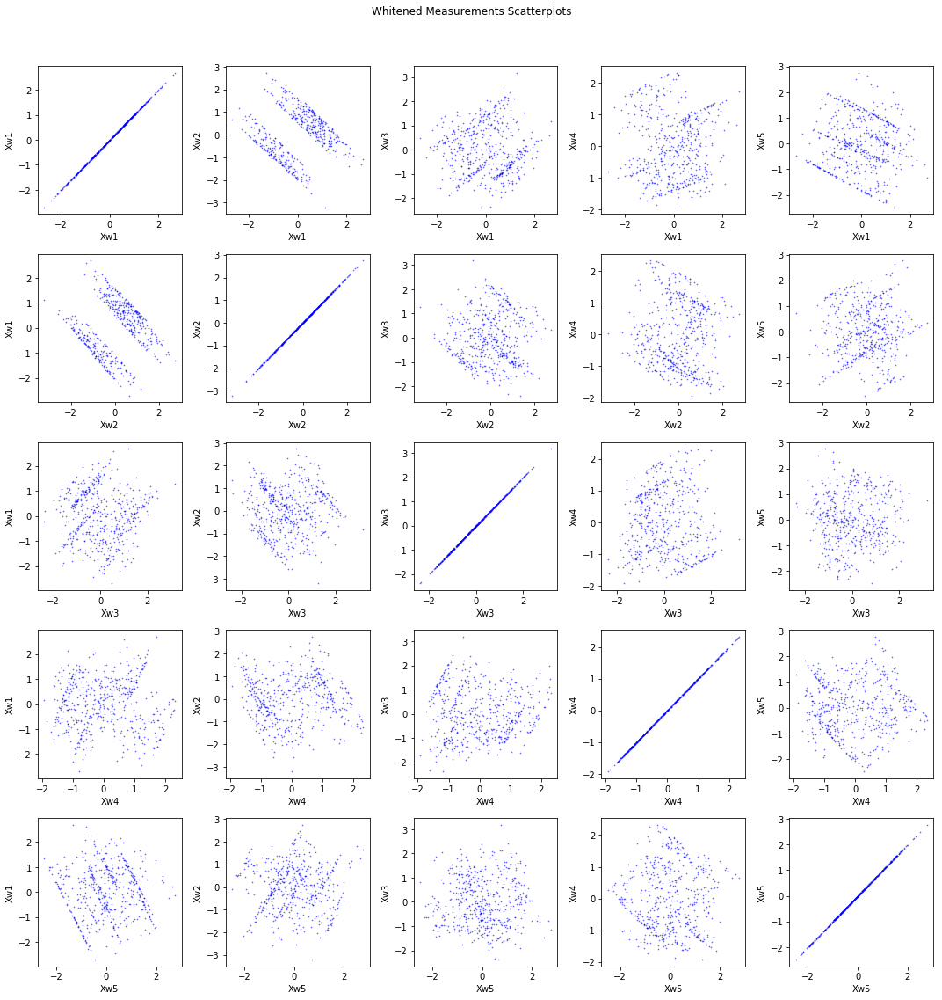

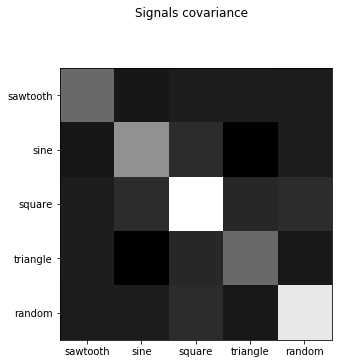

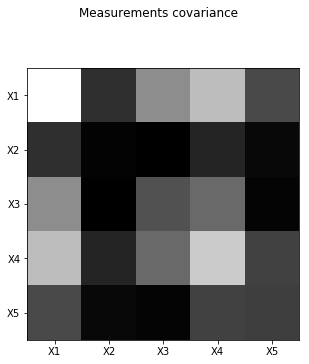

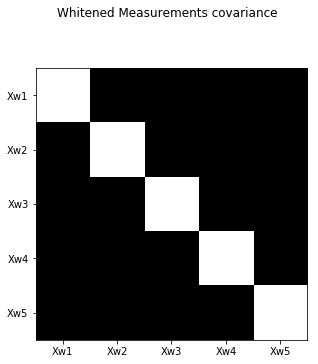

In [15]:
measurements = ["X1","X2","X3","X4","X5"]
measurements_w = ["Xw1","Xw2","Xw3","Xw4","Xw5"]

def plot_scatter(X, title, subtitles=[]):
    
    SIZE = X.shape[0]
    f, axes = plt.subplots(SIZE, SIZE, figsize=(15, 15))
    
    f.suptitle(title, y=1.05)
    
    for i in range(SIZE):
        for j in range(SIZE):
            ax = axes[i,j]
            ax.scatter(X[i, :],X[j, :], c="blue", s=0.5, alpha=0.5)
            ax.set_xlabel(subtitles[i])
            ax.set_ylabel(subtitles[j])
    
    plt.tight_layout()
    
    
def plot_covariance(X, title, labels=[]):
    
    f, ax = plt.subplots(1, figsize=(5, 5))
    f.suptitle(title, y=1.05)
    
    C = X@X.T / X.shape[0]
    ax.set_xticks([0,1,2,3,4])
    ax.set_xticklabels(labels)
    ax.set_yticks([0,1,2,3,4])
    ax.set_yticklabels(labels)
    ax = imshow(C, cmap='gray', interpolation='nearest')  

    
plot_scatter(S, 'Signals Scatterplots', signals)
plot_scatter(X, 'Measurements Scatterplots', measurements)
plot_scatter(Xw, 'Whitened Measurements Scatterplots', measurements_w)

plot_covariance(S, "Signals covariance", signals)
plot_covariance(X, "Measurements covariance", measurements)
plot_covariance(Xw, "Whitened Measurements covariance", measurements_w)

Are the signals independent after whitening?

Measurements from different X after whitening have null correlation (covariance), although this does not grant independence. For example, looking at the scatterplots for datapoints from whitened X1 and X2, we see that points follow two evident stripes in separated areas of the plot. In general, anyway, we notice that dependences among mixtures (X) decrease.
You can notice this by comparing scatterplots of whitened data and original data. In the plots showing correlation of original measurements, in most cases a linear dependency between signals 1 and 2 is evident. On the other hand, looking at the plots with whitened measurements, it is evident how points are now almost homogeneusly spread over the graph, with no evident elliptical shape showing possible correlations on any orientation.

Also, this increment in independence is more evident considering the plot of the covariance matrix of whitened data, where all values are zero (black cells), but for the ones in the diagonal (white).
Indeed, whitening the data produces an Identity covariance matrix.

### 1.6 Covariance (5 points)
Explain what a covariant algorithm is. 

Non-covariant algorithms have an inconsistency problem in the dimensions of the update value and the derivative of the objective function with repsect of $\mathbf{w}$. Also, this algorithm is not sensitive to changes in the scale of $\mathbf{w}$.

Solving this issues, covariant algorithms introduce a positive semi-definite matrix $\mathbf{M}$ in the update rule, fixing the dimensionality problem. This matrix can be computed from the natural metric (distance) in the parameter space of $\mathbf{w}$. If this is not possible, the matrix can also be found looking at the curvature of the objective function. To do this, we take the negative second order gradient with respect to $\mathbf{w}$ of the objective function, and then invert the resulting matrix. 

Algorithms using this matrix are covariant. In particular, an example of covariant algorithms is the Newton update rule, which uses the matrix found looking at the curvature to define its update steps.

### 1.7 Independent Component Analysis (25 points)
Implement the covariant ICA algorithm as described in MacKay. Write a function `ICA(X, activation_function, learning_rate)`, that returns the demixing matrix $\mathbf{W}$. The input `activation_function` should accept a function such as `lambda a: -tanh(a)`. Update the gradient in batch mode, averaging the gradients over the whole dataset for each update. Make it efficient, so use matrix operations instead of loops where possible (loops are slow in interpreted languages such as python and matlab, whereas matrix operations are internally computed using fast C code). Experiment with the learning rate and the initialization of $\mathbf{W}$. Your algorithm should be able to converge (i.e. `np.linalg.norm(grad) < 1e-5`) in within 10000 steps.

In [16]:
### 1.7 Independent Component Analysis

import time

def ICA(X, activation_function, learning_rate=0.1, W_init=None, verbose=False, return_info=False):
    
    [M, N] = X.shape
    
    if W_init is None:
        W = np.random.randn(X.shape[0], X.shape[0])
    else:
        W = W_init
            
    start_time = time.time()
    iter_time = start_time
    
    iteration = 0
    
    grad_magnitude = 1
    
    while grad_magnitude > 1e-5 and iteration < 100000:

        A = W@X
        
        Z = activation_function(A)
        
        X_1 = W.T@A
        
        grad = W + Z@X_1.T / N
        
        grad_magnitude = np.linalg.norm(grad.flatten())
        
        W += learning_rate * grad
        
        if iteration % 1000 == 0 and verbose:
            print('iteration: {}; gradient magnitude: {}; time elapsed: {}'.format(iteration, grad_magnitude, time.time() - iter_time))
            iter_time = time.time()
        iteration += 1
    
    if np.isnan(grad_magnitude):
        print('Warning: Algorithm Diverged!')
    
    if verbose:
        print('Total Time:{}'.format(time.time() - start_time))
        
    if return_info:
        return W, iteration
    else:
        return W
    
    

W_est = ICA(Xw, phi_3)  # Compare with ICA(X)

In [17]:
# We will test your function so make sure it runs with only X and phi as input, and returns only W
# Also it should converge for all activation functions

W_estimates = [ICA(Xw, activation_function=phi) for phi in activation_functions]
assert all([W_est.shape == (num_sources, num_sources) for W_est in W_estimates])


/home/davide/miniconda3/envs/ml2labs/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in power
  


In [18]:
[M, T] = Xw.shape

learning_rates = [0.1, 0.05, 0.01, 0.005, 0.001]
W_inits = {'gaussian': lambda : np.random.randn(M, M), 'non-singular':lambda : random_nonsingular_matrix(M), 'identity': lambda : np.eye(M), 'uniform': lambda : np.ones((M, M))/M}

for lr in learning_rates:
    print('Using LR = {}'.format(lr))
    for init_name, init_f in W_inits.items():
        print('Using "{}" as initialization for W'.format(init_name))
        
        results = [ICA(Xw, activation_function=phi, learning_rate=lr, W_init=init_f(), return_info=True) for phi in activation_functions]
        
        for i in range(len(activation_functions)):
            if any(np.isnan(results[i][0])):
                print('\tUsing $\phi_{}$, algorithm diverged!'.format(i))
            else:
                print('\tUsing $\phi_{}$, number of iterations to convergence: {}'.format(i, results[i][1]))
    


Using LR = 0.1
Using "gaussian" as initialization for W


/home/davide/miniconda3/envs/ml2labs/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in power
  


	Using $\phi_0$, number of iterations to convergence: 1344
	Using $\phi_1$, number of iterations to convergence: 3252
	Using $\phi_2$, algorithm diverged!
	Using $\phi_3$, number of iterations to convergence: 3149
Using "non-singular" as initialization for W
	Using $\phi_0$, number of iterations to convergence: 1473
	Using $\phi_1$, number of iterations to convergence: 4064
	Using $\phi_2$, algorithm diverged!
	Using $\phi_3$, number of iterations to convergence: 2538
Using "identity" as initialization for W
	Using $\phi_0$, number of iterations to convergence: 1494
	Using $\phi_1$, number of iterations to convergence: 3184
	Using $\phi_2$, number of iterations to convergence: 1087
	Using $\phi_3$, number of iterations to convergence: 2511
Using "uniform" as initialization for W
	Using $\phi_0$, number of iterations to convergence: 53
	Using $\phi_1$, number of iterations to convergence: 39
	Using $\phi_2$, number of iterations to convergence: 25
	Using $\phi_3$, number of iterations t

It seems that with too high learning rates, $\phi_2$ struggles to converge (the very low number of iterations in these cases does not mean the algorithm converged but that it diverged).
It is interesting to note that using the uniform matrix as initialization makes the algorithm converge way faster.

### 1.8 Experiments  (5 points)
Run ICA on the provided signals using each activation function $\phi_0, \ldots, \phi_3$ (or reuse `W_estimates`). Use the found demixing matrix $\mathbf{W}$ to reconstruct the signals and plot the retreived signals for each choice of activation function.

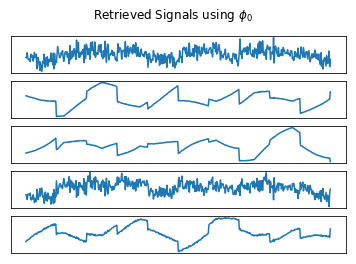

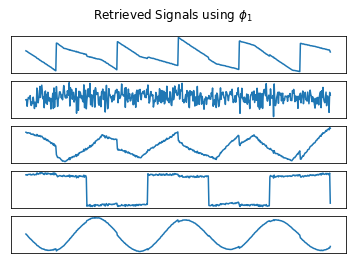

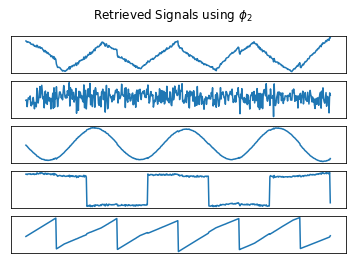

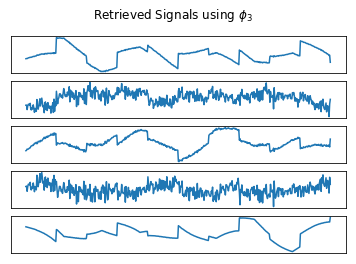

In [19]:
# 1.8 Experiments

S_dummy_reconstructed = []
W_estimates = [ICA(Xw, activation_function=phi, learning_rate=0.005) for phi in activation_functions]

for i in range(len(activation_functions)):
    W = W_estimates[i]
    
    s = W@Xw
    
    S_dummy_reconstructed.append(s)
    
    plot_signals(s, "Retrieved Signals using $\phi_{}$".format(i))
    
    


Experimenting with NonSingular Initialization


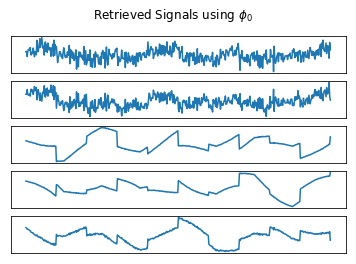

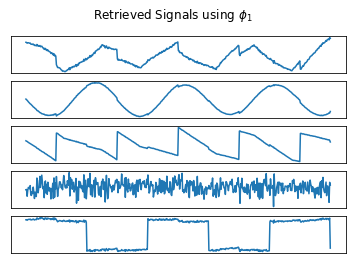

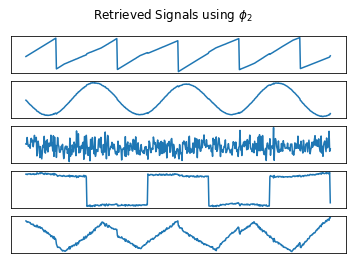

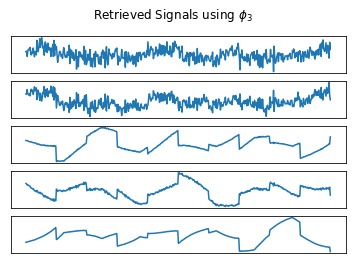

In [20]:

W_estimates = [ICA(Xw, activation_function=phi, learning_rate=0.005, W_init=random_nonsingular_matrix(M)) for phi in activation_functions]

print('Experimenting with NonSingular Initialization')
for i in range(len(activation_functions)):
    W = W_estimates[i]    
    s = W@Xw
    plot_signals(s, "Retrieved Signals using $\phi_{}$".format(i))
    
    


Experimenting with Identity Initialization


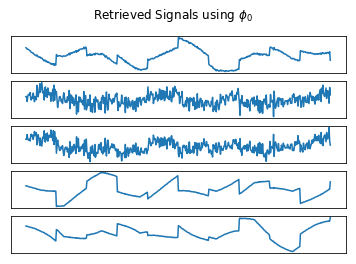

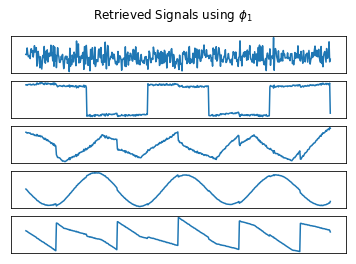

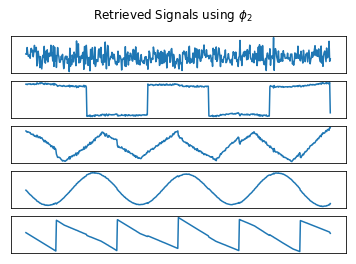

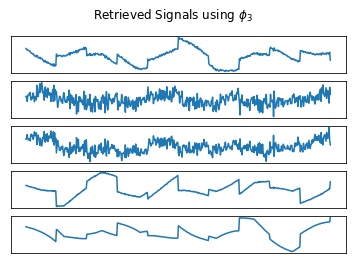

In [21]:
W_estimates = [ICA(Xw, activation_function=phi, learning_rate=0.005, W_init=np.eye(M)) for phi in activation_functions]

print('Experimenting with Identity Initialization')
for i in range(len(activation_functions)):
    W = W_estimates[i]
    s = W@Xw
    plot_signals(s, "Retrieved Signals using $\phi_{}$".format(i))
    
    


Experimenting with Uniform Initialization


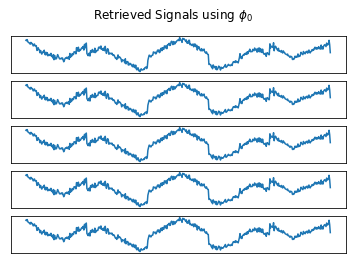

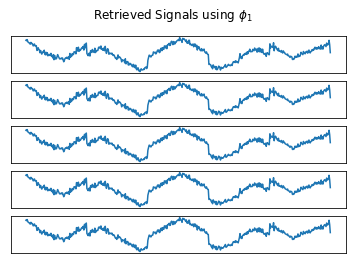

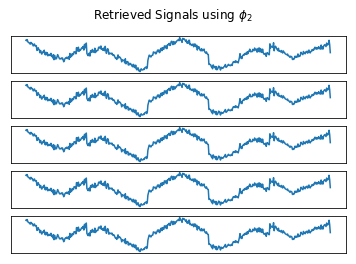

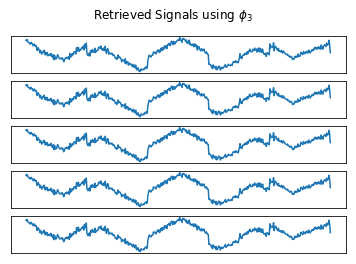

In [22]:
W_estimates = [ICA(Xw, activation_function=phi, learning_rate=0.005, W_init=np.ones((M, M))/M) for phi in activation_functions]

print('Experimenting with Uniform Initialization')
for i in range(len(activation_functions)):
    W = W_estimates[i]
    s = W@Xw
    plot_signals(s, "Retrieved Signals using $\phi_{}$".format(i))
    
    


Though Uniform initialization makes the algorithm converge faster, it makes all the reconstructed signals converge to the same one (an average of the original signals)

In [33]:
import time

def does_whitening_make_a_difference():
    # Does it make a difference (in terms of speed of convergence) 
    # if you whiten your data before running ICA?
    
    # Return True or False
    start_whitened = time.time()
    
    try:
        whitened = [ICA(Xw, activation_function=phi, learning_rate=0.05, return_info=True) for phi in activation_functions]
    except:
        pass
    
    time_whitened = time.time() - start_whitened
    
    start_normal = time.time()
    
    try:
        normal = [ICA(X, activation_function=phi, learning_rate=0.05, return_info=True) for phi in activation_functions]
    except:
        pass
    
    time_normal = time.time() - start_normal
    
    whitened_diverged = sum([any(np.isnan(r[0])) for r in whitened])
    normal_diverged = sum([any(np.isnan(r[0])) for r in normal])
    
    whitened_iterations = sum([r[1] for r in whitened if not any(np.isnan(r[0]))])
    normal_iterations = sum([r[1] for r in normal if not any(np.isnan(r[0]))])
    
    print('Diverged: Normal: {}; With Whitening: {}'.format(normal_diverged, whitened_diverged))
    print('Iterations: Normal: {}; With Whitening: {}'.format(normal_iterations, whitened_iterations))
    print('RunTime: Normal: {}; With Whitening: {}'.format(time_normal, time_whitened))
    
    if whitened_diverged < normal_diverged:
        print('True')
        return True
    
    if whitened_diverged > normal_diverged:
        print('False')
        return False
    
    
    
    answer = bool((normal_iterations - whitened_iterations)/ normal_iterations > 0.01)
    
    print(answer)
    
    return answer

In [34]:
assert type(does_whitening_make_a_difference()) == bool

/home/davide/miniconda3/envs/ml2labs/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in power
  


Diverged: Normal: 1; With Whitening: 1
Iterations: Normal: 22430; With Whitening: 13576
RunTime: Normal: 1.4401299953460693; With Whitening: 0.8850071430206299
True


### 1.9 Audio demixing (10 points)
The 'cocktail party effect' refers to the ability humans have to attend to one speaker in a noisy room. We will now use ICA to solve a similar but somewhat idealized version of this problem. The code below loads 5 sound files and plots them.

Use a random non-singular mixing matrix to mix the 5 sound files. You can listen to the results in your browser using `play_signals`, or save them to disk if this does not work for you. Plot histograms of the mixed audio and use your ICA implementation to de-mix these and reproduce the original source signals. As in the previous exercise, try each of the activation functions.

Keep in mind that this problem is easier than the real cocktail party problem, because in real life there are often more sources than measurements (we have only two ears!), and the number of sources is unknown and variable. Also, mixing is not instantaneous in real life, because the sound from one source arrives at each ear at a different point in time. If you have time left, you can think of ways to deal with these issues.

In [25]:
import scipy.io.wavfile
from IPython.display import Audio, display, Markdown

# Save mixtures to disk, so you can listen to them in your audio player
def save_wav(data, out_file, rate):
    scaled = np.int16(data / np.max(np.abs(data)) * 32767)
    scipy.io.wavfile.write(out_file, rate, scaled)

# Or play them in your browser
def play_signals(S, sample_rate, title="Signals"):
    display(Markdown(title))
    for signal in S:
        display(Audio(signal, rate=sample_rate))

Signals

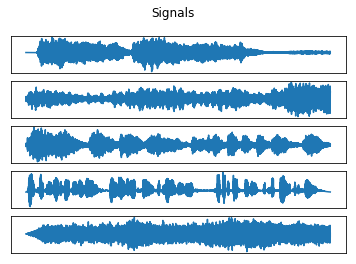

In [26]:
# Load audio sources
source_files = ['beet.wav', 'beet9.wav', 'beet92.wav', 'mike.wav', 'street.wav']
wav_data = []
sample_rate = None
for f in source_files:
    sr, data = scipy.io.wavfile.read(f, mmap=False)
    if sample_rate is None:
        sample_rate = sr
    else:
        assert(sample_rate == sr)
    wav_data.append(data[:190000])  # cut off the last part so that all signals have same length

# Create source and measurement data
S_audio = np.c_[wav_data]
plot_signals(S_audio)
play_signals(S_audio, sample_rate)

Mixed Signals

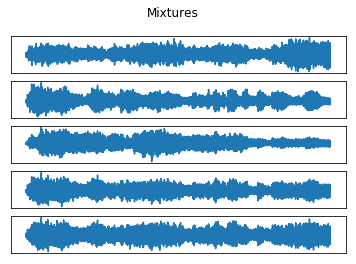

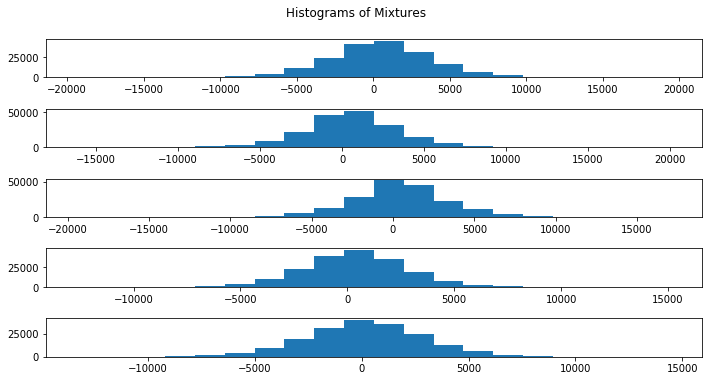

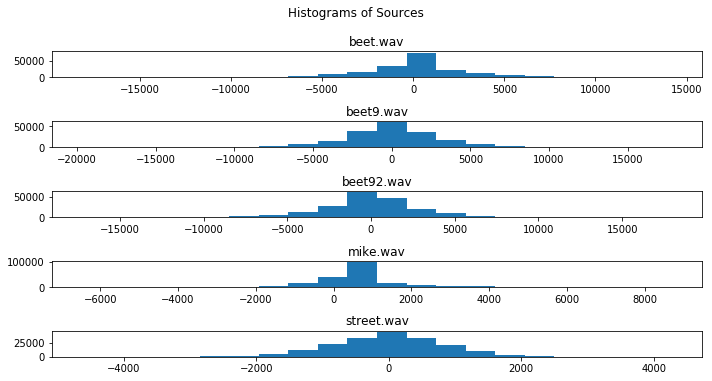

In [27]:
A_audio = random_nonsingular_matrix(d=S_audio.shape[0])
X_audio = make_mixtures(S_audio, A_audio)

plot_signals(X_audio, "Mixtures")

play_signals(X_audio, sample_rate, title='Mixed Signals')

plot_histograms(X_audio, 'Histograms of Mixtures')

plot_histograms(S_audio, 'Histograms of Sources', source_files)

Xw_audio = whiten(X_audio)

0
iteration: 0; gradient magnitude: 10.611431211553406; time elapsed: 0.015663623809814453
iteration: 1000; gradient magnitude: 0.1669006965637582; time elapsed: 8.831571340560913
iteration: 2000; gradient magnitude: 0.017765298212232772; time elapsed: 8.33301329612732
iteration: 3000; gradient magnitude: 0.0012265965937936097; time elapsed: 8.333582162857056
iteration: 4000; gradient magnitude: 0.00011288553974664742; time elapsed: 7.993750333786011
iteration: 5000; gradient magnitude: 1.5929655850503795e-05; time elapsed: 8.01836371421814
Total Time:43.596583127975464
Phi 0: 5260 iterations, Converged


Reconstructed Signals using $\phi_0$

1
iteration: 0; gradient magnitude: 17.179684714193524; time elapsed: 0.01304936408996582
iteration: 1000; gradient magnitude: 0.06427725143716871; time elapsed: 11.09826374053955
iteration: 2000; gradient magnitude: 0.02657006664525044; time elapsed: 10.249313592910767
iteration: 3000; gradient magnitude: 0.018183383579486647; time elapsed: 10.229470014572144
iteration: 4000; gradient magnitude: 0.016615900451633275; time elapsed: 10.210295915603638
iteration: 5000; gradient magnitude: 0.015185509517444167; time elapsed: 10.319257974624634
iteration: 6000; gradient magnitude: 0.012379992938177601; time elapsed: 10.1909818649292
iteration: 7000; gradient magnitude: 0.009135935282802139; time elapsed: 10.193258285522461
iteration: 8000; gradient magnitude: 0.006378663769198794; time elapsed: 10.20286250114441
iteration: 9000; gradient magnitude: 0.0043432113553187515; time elapsed: 10.208643674850464
iteration: 10000; gradient magnitude: 0.0029314593601526663; time elapsed: 10.201518058

Reconstructed Signals using $\phi_1$

2
iteration: 0; gradient magnitude: 689.2768114663871; time elapsed: 0.09694075584411621
iteration: 1000; gradient magnitude: 0.3092010308976954; time elapsed: 79.71319460868835
iteration: 2000; gradient magnitude: 0.14001424269230828; time elapsed: 78.91133093833923
iteration: 3000; gradient magnitude: 0.10501630441142537; time elapsed: 80.31855416297913
iteration: 4000; gradient magnitude: 0.08597914167988753; time elapsed: 79.36478972434998
iteration: 5000; gradient magnitude: 0.06783655070178458; time elapsed: 79.22466349601746
iteration: 6000; gradient magnitude: 0.05312152524941698; time elapsed: 79.33523511886597
iteration: 7000; gradient magnitude: 0.04261421622454364; time elapsed: 79.82446217536926
iteration: 8000; gradient magnitude: 0.0357063300281382; time elapsed: 79.19776225090027
iteration: 9000; gradient magnitude: 0.031364956288380735; time elapsed: 83.82750105857849
iteration: 10000; gradient magnitude: 0.02862139742389467; time elapsed: 88.48184847831726
iteration: 

iteration: 89000; gradient magnitude: 7.041186675165233e-05; time elapsed: 79.10279154777527
iteration: 90000; gradient magnitude: 6.855870699685452e-05; time elapsed: 79.20217108726501
iteration: 91000; gradient magnitude: 6.677405777001061e-05; time elapsed: 79.46684312820435
iteration: 92000; gradient magnitude: 6.505288709194729e-05; time elapsed: 83.42913603782654
iteration: 93000; gradient magnitude: 6.33907612073927e-05; time elapsed: 81.25458645820618
iteration: 94000; gradient magnitude: 6.178376370357224e-05; time elapsed: 82.31649422645569
iteration: 95000; gradient magnitude: 6.022842552779688e-05; time elapsed: 79.38188433647156
iteration: 96000; gradient magnitude: 5.872166452716585e-05; time elapsed: 79.18422555923462
iteration: 97000; gradient magnitude: 5.726073326741426e-05; time elapsed: 80.38361954689026
iteration: 98000; gradient magnitude: 5.584317406152659e-05; time elapsed: 80.86362361907959
iteration: 99000; gradient magnitude: 5.446678023023988e-05; time elaps

Reconstructed Signals using $\phi_2$

3
iteration: 0; gradient magnitude: 11.347106337586794; time elapsed: 0.012191057205200195
iteration: 1000; gradient magnitude: 0.1562168081772956; time elapsed: 11.524201393127441
iteration: 2000; gradient magnitude: 0.052634222434642; time elapsed: 11.50456690788269
iteration: 3000; gradient magnitude: 0.006580878846227427; time elapsed: 11.502074956893921
iteration: 4000; gradient magnitude: 0.0009849396008595247; time elapsed: 11.556368589401245
iteration: 5000; gradient magnitude: 0.000181331621867689; time elapsed: 11.999996185302734
iteration: 6000; gradient magnitude: 3.7073123360639394e-05; time elapsed: 12.23948860168457
Total Time:80.25703477859497
Phi 3: 6848 iterations, Converged


Reconstructed Signals using $\phi_3$

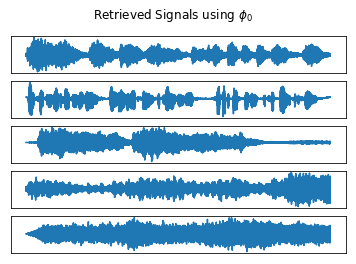

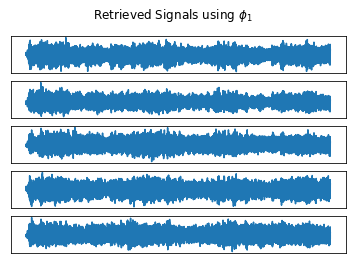

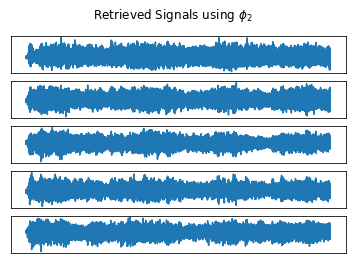

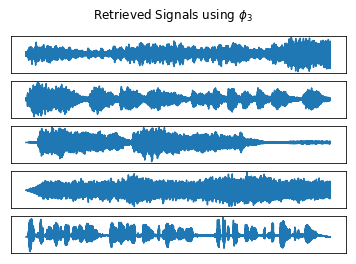

In [33]:
### 1.9 Audio demixing

S_reconstructed = []

learning_rates = [0.01, 0.01, 0.001, 0.01]

for i, phi in enumerate(activation_functions):
    print(i)
    W, iterations = ICA(Xw_audio, activation_function=phi, learning_rate=learning_rates[i], return_info=True, verbose=True)
    
    print("Phi {}: {} iterations, {}".format(i, iterations, 'DIVERGED' if any(np.isnan(W)) else 'Converged'))
    
    s = W@Xw_audio
    
    S_reconstructed.append(s)
    
    plot_signals(s, "Retrieved Signals using $\phi_{}$".format(i))
    play_signals(s, sample_rate, title='Reconstructed Signals using $\phi_{}$'.format(i))

Report your results. Using which activation functions ICA recovers the sources?

The activation functions which seem to work better are $\phi_0$ and $\phi_3$ which reconstruct the sounds almost perfectly. However, $\phi_2$ seems to have problems to converge due to a large learning rate.

### 1.10 Excess Kurtosis (15 points)
The (excess) kurtosis is a measure of 'peakedness' of a distribution. It is defined as
$$
\verb+Kurt+[X] = \frac{\mu_4}{\sigma^4} - 3 = \frac{\operatorname{E}[(X-{\mu})^4]}{(\operatorname{E}[(X-{\mu})^2])^2} - 3
$$
Here, $\mu_4$ is known as the fourth moment about the mean, and $\sigma$ is the standard deviation.
The '-3' term is introduced so that a Gaussian random variable has 0 excess kurtosis.
We will now try to understand the performance of the various activation functions by considering the kurtosis of the corresponding priors, and comparing those to the empirical kurtosis of our data.

#### 1.10.1 (10 points)
First, compute analytically the kurtosis of the four priors that you derived from the activation functions before. You may find it helpful to use an online service such as [Wolfram Alpha](https://www.wolframalpha.com/) or [Integral Calculator](https://www.integral-calculator.com/) to (help you) evaluate the required integrals. Give your answer as both an exact expression as well as a numerical approximation (for example $\frac{\pi}{2} \approx 1.571$).

Noting that in all these distribution the mean is $\mu = 0$, we only need to compute the moments of fourth order and the square of the variance (which is the moment of second order).
Finally, we define with $K$ the normalization factor that makes this functions probability distribution (where the integral over R equals 1), and thus $K = \int_{-\infty}^{\infty} f(a) da $.
Also, since this is a constant, we can take it out from every integrals when computing expectations.

## $p_0(a) = \frac{e^{-a}}{K(1 + e^{-2a})}$ 

$$K = \frac{\pi}{2} \approx 1.57079$$

$$\operatorname{E}[(X-{\mu})^4] = \frac{1}{K} \int_{-\infty}^{\infty} a^4 \frac{e^{-a}}{1 + e^{-2a}} da \approx \frac{1}{K} 47.8156$$

$$\operatorname{E}[(X-{\mu})^2]^2 = (\frac{1}{K}\int_{-\infty}^{\infty} a^2 \frac{e^{-a}}{1 + e^{-2a}} da) ^2 \approx \frac{1}{K^2}3.87578^2 \approx \frac{1}{K^2}15.02167$$

$$\verb+Kurt+[X] =  \frac{\operatorname{E}[(X-{\mu})^4]}{(\operatorname{E}[(X-{\mu})^2])^2} - 3 \approx  \frac{K^2}{K}\frac{47.8156}{15.02167} -3 \approx 1.57079 * 0.8536 - 3 = 2.00000$$

***
## $p_1(a) = e^{-\frac{1}{2}a^2 + a} + e^{-\frac{1}{2}a^2 - a}$ 

$$K =2^\frac{3}{2}\sqrt{\mathrm{e}}\sqrt{{\pi}} \approx 8.26546$$

$$\operatorname{E}[(X-{\mu})^4] = \frac{1}{K} \int_{-\infty}^{\infty} a^4 e^{-\frac{1}{2}a^2 + a} + e^{-\frac{1}{2}a^2 - a} da = \frac{1}{K} 11\cdot\sqrt{2}\sqrt{\mathrm{e}}\sqrt{{\pi}}$$

$$\operatorname{E}[(X-{\mu})^2]^2 = (\frac{1}{K} \int_{-\infty}^{\infty} a^2 e^{-\frac{1}{2}a^2 + a} + e^{-\frac{1}{2}a^2 - a} da) ^2 \approx \frac{1}{K^2} (3\cdot\sqrt{2}\sqrt{\mathrm{e}}\sqrt{{\pi}})^2 \approx \frac{1}{K^2}18 \mathrm{e} \pi$$

$$\verb+Kurt+[X] =  \frac{\operatorname{E}[(X-{\mu})^4]}{(\operatorname{E}[(X-{\mu})^2])^2} - 3 \approx  \frac{2^\frac{3}{2}\sqrt{\mathrm{e}}\sqrt{{\pi}}  \cdot11\cdot\sqrt{2}\sqrt{\mathrm{e}}\sqrt{{\pi}}}{18 \mathrm{e} \pi} -3 = \frac{44}{18} - 3 \approx -0.55556$$

***

## $p_2(a) = e^{-\frac{1}{4}a^4}$ 

$$K = \dfrac{\operatorname{\Gamma}\left(\frac{1}{4}\right)}{\sqrt{2}} \approx 2.56369$$

$$\operatorname{E}[(X-{\mu})^4] = \frac{1}{K}\int_{-\infty}^{\infty} a^4 e^{-\frac{1}{4}a^4} da \approx \frac{1}{K} 2.56369$$

$$\operatorname{E}[(X-{\mu})^2]^2 = (\frac{1}{K}\int_{-\infty}^{\infty} a^2 e^{-\frac{1}{4}a^4} da) ^2 \approx \frac{1}{K^2} 1.733^2 \approx \frac{1}{K^2} 3.0033$$

$$\verb+Kurt+[X] =  \frac{\operatorname{E}[(X-{\mu})^4]}{(\operatorname{E}[(X-{\mu})^2])^2} - 3 \approx  \frac{K 2.56369}{3.0033} -3 \approx 2.56369* 0.8536 - 3 = -0.81163$$

***

## $p_3(a) = \frac{1}{(a^2 + 5)^3}$ 

$$K = \dfrac{3{\pi}}{8{\cdot}5^\frac{5}{2}} \approx 0.021074$$

$$\operatorname{E}[(X-{\mu})^4] = \frac{1}{K}\int_{-\infty}^{\infty} a^4 \frac{1}{(a^2 + 5)^3} da = \frac{1}{K}\frac{3\pi}{8\sqrt{5}}$$

$$\operatorname{E}[(X-{\mu})^2]^2 = (\frac{1}{K}\int_{-\infty}^{\infty} a^2 \frac{1}{(a^2 + 5)^3} da) ^2 = (\frac{\pi}{8 * 5^\frac{3}{2}})^2 = \frac{1}{K^2} \frac{\pi^2}{8^2 * 5^\frac{6}{2}}$$

$$\verb+Kurt+[X] =  \frac{\operatorname{E}[(X-{\mu})^4]}{(\operatorname{E}[(X-{\mu})^2])^2} - 3 =  K \frac{\frac{3\pi}{8\sqrt{5}}}{\frac{\pi^2}{8^2 * 5^\frac{6}{2}}} -3 = K \frac{ 24 \sqrt{5^5}}{\pi} -3 \approx 427.1071*  0.021074 -3 = 6.00086$$

***





In [37]:
def get_kurtosis():
    return [2.00000, -0.55556, -0.81163, 6.00086]
    

In [38]:
# Let's check
kurtosis = get_kurtosis()
print (kurtosis)
assert len(kurtosis) == 4


[2.0, -0.55556, -0.81163, 6.00086]


#### 1.10.2 (5 points)
Now use the `scipy.stats.kurtosis` function, with the `fisher` option set to `True`, to compute the empirical kurtosis of the dummy signals and the real audio signals.

Can you use this data to explain the performance of the various activation functions on the synthetic and real data?

In [37]:
### 1.10.2 Excess Kurtosis
import scipy.stats

print('Kurtosis with Dummy Signals')

dummy_signals_kurtosis = scipy.stats.kurtosis(S.T, fisher=True)
print('\n')
print('Real: {}'.format(sorted(dummy_signals_kurtosis)))
print('\n')
for i in range(len(activation_functions)):
    reconstructed_dummy_kurtosis = scipy.stats.kurtosis(S_dummy_reconstructed[i].T, fisher=True)
    print('Phi{}: {}$'.format(i, sorted(reconstructed_dummy_kurtosis)))
print('\n')

print('Kurtosis with Real Audio Signals')
real_audio_kurtosis = scipy.stats.kurtosis(S_audio.T, fisher=True)
print('\n')
print('Real: {}'.format(sorted(real_audio_kurtosis)))
print('\n')
for i in range(len(activation_functions)):
    reconstructed_audio_kurtosis = scipy.stats.kurtosis(S_reconstructed[i].T, fisher=True)
    print('Phi{}: {}'.format(i, sorted(reconstructed_audio_kurtosis)))

Kurtosis with Dummy Signals


Real: [-1.8401970082696615, -1.4828711324393096, -1.2000384006144103, -1.1964024434411016, -0.23516202720184598]


Phi0: [-0.17629751686735728, -0.03782152263535199, 0.04382851159055701, 0.19999550686627598, 0.23932522525160715]$
Phi1: [-1.8273704261218036, -1.4814506977081365, -1.1622432957189204, -1.0989095829000082, -0.269662510057493]$
Phi2: [-1.8282517003242031, -1.4884526398106026, -1.1819495201001657, -1.1616370306202848, -0.2581992852938142]$
Phi3: [-0.17429202579540126, -0.005821652663009935, 0.06944224274638744, 0.23285850744908787, 0.24586842251399066]$


Kurtosis with Real Audio Signals


Real: [0.5388758081585339, 1.7943151667734192, 1.936092953713005, 2.0688506407485283, 5.051917206465037]


Phi0: [0.5390092056032696, 1.795177704492966, 1.9349151046898596, 2.073859084651432, 5.053299768164676]$
Phi1: [0.26825109323966023, 0.272167719784858, 0.319266211887856, 0.46018923500200515, 0.5070670008916855]$
Phi2: [0.18680455559093545, 0.305723649190

## Real Audio Signals

Considering the Kurtosis values is helpful to quickly distinguish good and bad performances when comparing reconstructed and real data. The kurtosis values in this case are computed over the distribution of frequencies in our audios (both reconstructed and real).
Indeed, if we want to generate audios that matches the original one, it cannot be that the distribution of frequencies is very different between them. Since Kurtosis value describes the "shape" in the tail regions of the distribution, it is easy to spot unmatching audio waves if the values are (very) different. In particular we are using Pearson's version of kurtosis, namely *excess kurtosis*.

For example, consider the Kurtosis for the data generated using the activation functions 1 and 2. Since those lists of values clearly deviate from the Kurtosis from real data, those reconstructions cannot be accurate. On the other hand, values obtained by generating audios with functions 0 and 3 are very similar (up to the second decimal digit) to the real ones. We can conclude that these reconstructed tracks will be more accurate than the ones obtained with activation functions 1  and 2.

## Dummy Signals

On the other way, we notice how priors 1 and 2 work better with the dummy audio signals.
Indeed, Kurtosis values computed on audios reconstructed using those two priors are very similar to the real ones.

We can explain the different behavior priors on real and dummy audio signals by looking at the frequence histograms.
When looking at the real audio sources, we notice how the distribution of frequencies is pretty sharp towards the middle of the histogram. Accordingly, priors 0 and 3 have sharper distributions.
On the other hand, dummy signals have flatter distributions, with still relevant number of occurrencies towards the tails of the distribution. 

Finally, we can compare this evidences with the kurtosis of the priors we just computed. Once again, distributions 0 and 3 have higher values, meaning that the tails are "sharper" (Leptokurtic distribution), while for priors 1 and 2 the kurtosis are slightly negative, meaning that the distributions are Platykurtic, with flatter tails.